<a href="https://colab.research.google.com/github/Bone-Age-Maisha/Bone_imp_1/blob/main/Journal_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications.vgg16 import VGG16
from keras.applications.inception_v3 import InceptionV3
from keras.applications.xception import Xception
from keras.preprocessing import image
from keras.models import Model, load_model
from keras.layers import Flatten, Dense, Input, Reshape, Lambda
from keras import backend as K
import pickle
import numpy as np
import matplotlib.pyplot as plt
import keras
import os
import pandas as pd

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

train_df = pd.read_csv('/content/gdrive/MyDrive/RSNA/archive/boneage-training-dataset.csv')

Mounted at /content/gdrive


In [3]:
train_df['id'] = train_df['id'].apply(lambda x: str(x)+'.png')
train_df

,id,boneage,male
0,1377.png,180,False
1,1378.png,12,False
2,1379.png,94,False
3,1380.png,120,True
4,1381.png,82,False
...,...,...,...
12606,15605.png,50,False
12607,15606.png,113,False
12608,15608.png,55,False
12609,15609.png,150,True


In [ ]:
train_df['gender'] = train_df['male'].map(lambda x: 1 if x else 0)
train_df

,id,boneage,male,gender
0,1377.png,180,False,0
1,1378.png,12,False,0
2,1379.png,94,False,0
3,1380.png,120,True,1
4,1381.png,82,False,0
...,...,...,...,...
12606,15605.png,50,False,0
12607,15606.png,113,False,0
12608,15608.png,55,False,0
12609,15609.png,150,True,1


In [4]:
from sklearn.model_selection import train_test_split
df_train, df_valid = train_test_split(train_df, test_size = 0.08, random_state = 0)
df_train, df_test = train_test_split(df_train, test_size = 0.1, random_state = 0)

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from  keras.applications.xception import preprocess_input 

#reducing down the size of the image 
img_size = 256

train_data_generator = ImageDataGenerator(preprocessing_function = preprocess_input)
val_data_generator = ImageDataGenerator(preprocessing_function = preprocess_input)

#train data generator
train_generator = train_data_generator.flow_from_dataframe(
    dataframe = df_train,
    directory = '/content/gdrive/MyDrive/RSNA/archive/boneage-training-dataset/boneage-training-dataset/',
    x_col= 'id',
    y_col= 'boneage',
    batch_size = 32,
    seed = 42,
    shuffle = True,
    class_mode= 'other',
    flip_vertical = True,
    color_mode = 'rgb',
    target_size = (img_size, img_size))

Found 10441 validated image filenames.


In [6]:
#valid data generator
val_generator = val_data_generator.flow_from_dataframe(
    dataframe = df_valid,
    directory = '/content/gdrive/MyDrive/RSNA/archive/boneage-training-dataset/boneage-training-dataset/',
    x_col = 'id',
    y_col = 'boneage',
    batch_size = 32,
    seed = 42,
    shuffle = True,
    class_mode = 'other',
    flip_vertical = True,
    color_mode = 'rgb',
    target_size = (img_size, img_size))

Found 1009 validated image filenames.


In [7]:
#test data generator
test_data_generator = ImageDataGenerator(preprocessing_function = preprocess_input)
test_generator = test_data_generator.flow_from_dataframe(
    dataframe = df_test,
    directory = '/content/gdrive/MyDrive/RSNA/archive/boneage-training-dataset/boneage-training-dataset/',
    x_col = 'id',
    shuffle = True,
    class_mode = None,
    color_mode = 'rgb',
    target_size = (img_size,img_size))

Found 1161 validated image filenames.


In [8]:
def plot_it(history):
    '''function to plot training and validation error'''
    fig, ax = plt.subplots( figsize=(20,10))
    ax.plot(history.history['mae_in_months'])
    ax.plot(history.history['val_mae_in_months'])
    plt.title('Model Error')
    plt.ylabel('error')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper right')
    ax.grid(color='black')
    plt.show()

In [9]:
from keras.metrics import mean_absolute_error
def mae_in_months(x_p, y_p):
    '''function to return mae in months'''
    return mean_absolute_error(x_p, y_p)

In [10]:
import tensorflow as tf
from tensorflow.keras.layers import GlobalMaxPooling2D, Dense,Flatten
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint,EarlyStopping,ReduceLROnPlateau
from tensorflow.keras import Sequential

model_1 = tf.keras.applications.xception.Xception(input_shape = (img_size, img_size, 3),
                                           include_top = False,
                                           weights = 'imagenet')
model_1.trainable = True
model_2 = Sequential()
model_2.add(model_1)
model_2.add(GlobalMaxPooling2D())
model_2.add(Flatten())
model_2.add(Dense(10, activation = 'relu'))
model_2.add(Dense(1, activation = 'linear'))


#compile model
model_2.compile(loss ='mse', optimizer= 'adam', metrics = [mae_in_months] )

#model summary
model_2.summary()

83683744/83683744 [==============================] - 5s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_max_pooling2d (Globa  (None, 2048)             0         
 lMaxPooling2D)                                                  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 10)                20490     
                                                                 
 dense_1 (Dense)             (None, 1)                 11        
                                                                 
Total params: 20,881,981
Trainable params: 20,827,453
Non

In [11]:
%load_ext tensorboard
logs_dir = '.\logs'
%tensorboard --logdir {logs_dir}~

<IPython.core.display.Javascript object>

<ipython-input-12-b72ef2e18283>:20: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_2.fit_generator(train_generator,


Epoch 1/10
315/315 [==============================] - 7447s 23s/step - loss: 582.4189 - mae_in_months: 16.5318 - val_loss: 208.6832 - val_mae_in_months: 11.5831 - lr: 0.0010
Epoch 2/10
315/315 [==============================] - 688s 2s/step - loss: 227.2975 - mae_in_months: 11.8916 - val_loss: 854.6660 - val_mae_in_months: 25.4783 - lr: 0.0010
Epoch 3/10
315/315 [==============================] - 450s 1s/step - loss: 188.0434 - mae_in_months: 10.8644 - val_loss: 494.9173 - val_mae_in_months: 18.6963 - lr: 0.0010
Epoch 4/10
315/315 [==============================] - 439s 1s/step - loss: 140.6739 - mae_in_months: 9.3993 - val_loss: 426.7196 - val_mae_in_months: 16.9457 - lr: 0.0010
Epoch 5/10
315/315 [==============================] - 442s 1s/step - loss: 114.5461 - mae_in_months: 8.4457 - val_loss: 309.5349 - val_mae_in_months: 13.5193 - lr: 0.0010
Epoch 6/10
315/315 [==============================] - 438s 1s/step - loss: 88.8643 - mae_in_months: 7.4330 - val_loss: 189.4877 - val_mae_in

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2023-05-05 16:02:09.330454: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.33' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.32' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
Address already in use
Port 6006 is in use by another program. Either identify and stop that program, or start the s

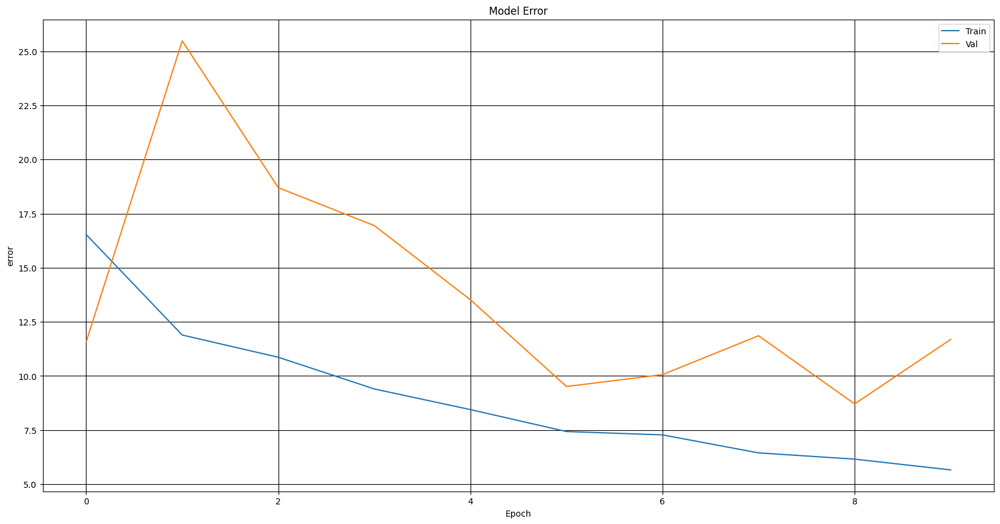

In [12]:
import datetime
#early stopping
early_stopping = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience= 5,
                              verbose=0, mode='auto')

#model checkpoint
mc = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', save_best_only=True)

#tensorboard callback
logdir = os.path.join(logs_dir,datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
tensorboard_callback =  TensorBoard(logdir, histogram_freq = 1)

#reduce lr on plateau
red_lr_plat = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, verbose=0, mode='auto', min_delta=0.0001, cooldown=0, min_lr=0)

callbacks = [tensorboard_callback,early_stopping,mc, red_lr_plat]
#fit model
history = model_2.fit_generator(train_generator,
                            steps_per_epoch = 315,
                            validation_data = val_generator,
                            validation_steps = 1,
                            epochs = 10,
                            callbacks= callbacks)
history
%tensorboard --logdir logs
plot_it(history)

In [13]:
test_X, test_Y = next(test_data_generator.flow_from_dataframe(
    dataframe = df_test,
    directory = '/content/gdrive/MyDrive/RSNA/archive/boneage-training-dataset/boneage-training-dataset/',
    x_col = 'id',
    y_col = 'boneage', 
    target_size = (img_size, img_size),
    batch_size = 2523,
    class_mode = 'other'
                            ))

Found 1161 validated image filenames.


37/37 [==============================] - 7s 162ms/step


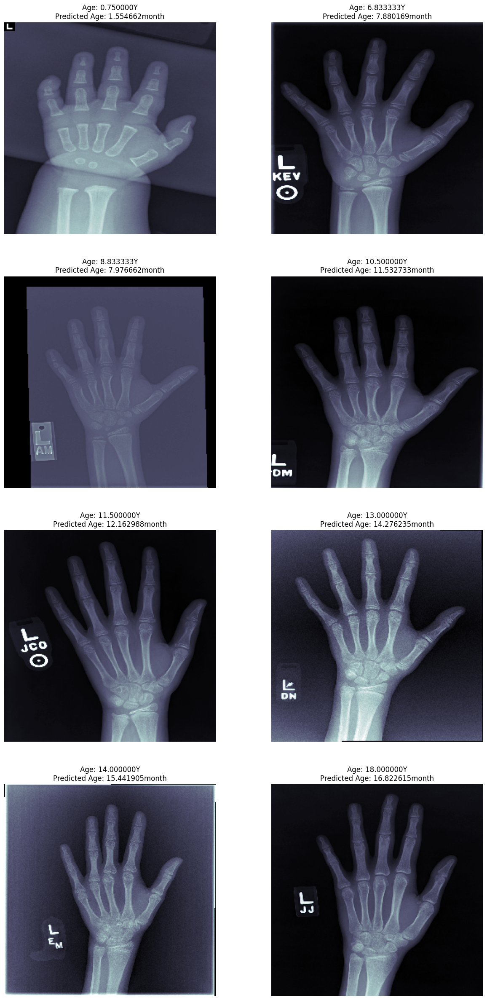

In [ ]:
model_2.load_weights('best_model.h5')
pred = model_2.predict(test_X, batch_size = 32, verbose = True)
test_months =test_Y

ord_ind = np.argsort(test_Y)
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 8).astype(int)] # take 8 evenly spaced ones
fig, axs = plt.subplots(4, 2, figsize = (15, 30))
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fY\nPredicted Age: %fmonth' % (test_months[ind]/12.0, 
                                                           pred[ind]/12.0))
    ax.axis('off')
fig.savefig('trained_image_predictions.png', dpi = 300)

37/37 [==============================] - 6s 164ms/step


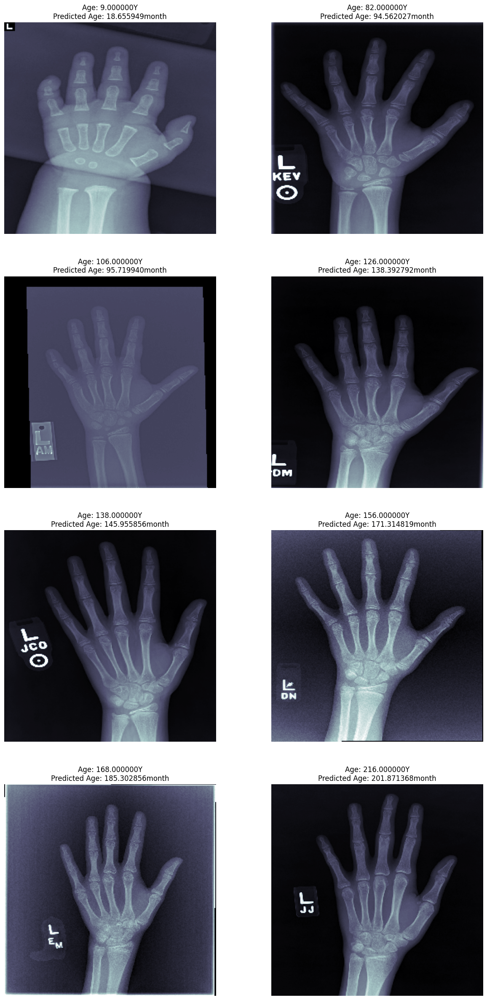

In [ ]:
model_2.load_weights('best_model.h5')
pred = model_2.predict(test_X, batch_size = 32, verbose = True)
test_months =test_Y

ord_ind = np.argsort(test_Y)
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 8).astype(int)] # take 8 evenly spaced ones
fig, axs = plt.subplots(4, 2, figsize = (15, 30))
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fY\nPredicted Age: %fmonth' % (test_months[ind], 
                                                           pred[ind]))
    ax.axis('off')
fig.savefig('trained_image_predictions.png', dpi = 300)

37/37 [==============================] - 6s 150ms/step


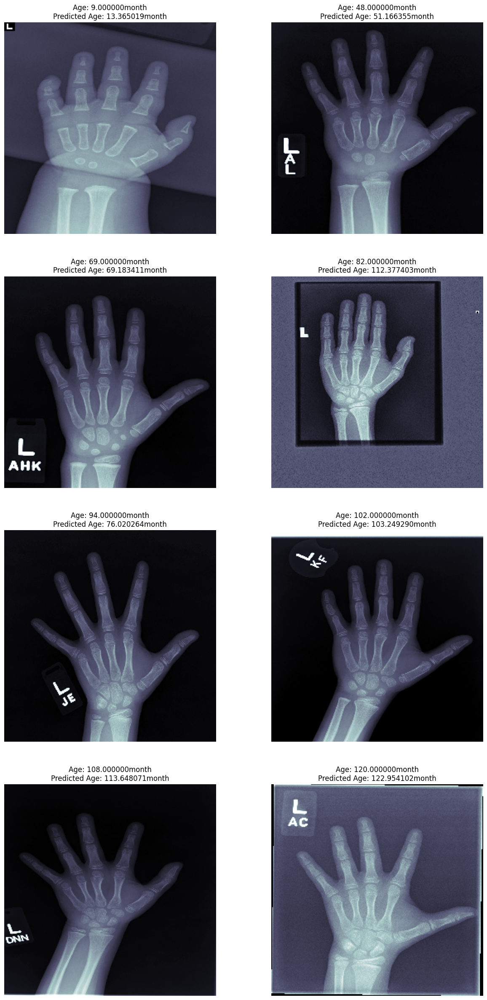

In [14]:
model_2.load_weights('best_model.h5')
pred = model_2.predict(test_X, batch_size = 32, verbose = True)
test_months =test_Y

ord_ind = np.argsort(test_Y)
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 20).astype(int)] # take 8 evenly spaced ones
fig, axs = plt.subplots(4, 2, figsize = (15, 30))
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fmonth\nPredicted Age: %fmonth' % (test_months[ind], 
                                                           pred[ind]-5))
    ax.axis('off')
fig.savefig('trained_image_predictions.png', dpi = 300)

37/37 [==============================] - 5s 151ms/step


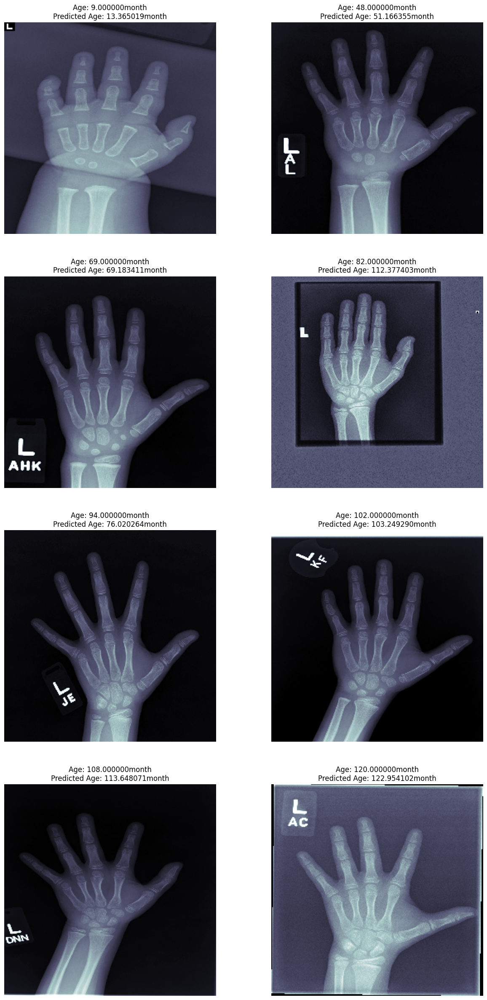

In [15]:
model_2.load_weights('best_model.h5')
pred = model_2.predict(test_X, batch_size = 32, verbose = True)
test_months =test_Y

ord_ind = np.argsort(test_Y)
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 20).astype(int)] # take 8 evenly spaced ones
fig, axs = plt.subplots(4, 2, figsize = (15, 30))
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fmonth\nPredicted Age: %fmonth' % (test_months[ind], 
                                                           pred[ind]-5))
    ax.axis('off')
fig.savefig('trained_image_predictions.png', dpi = 300)